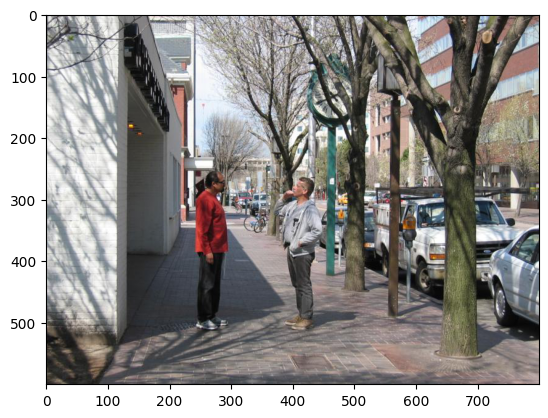

In [108]:
%reload_ext autoreload
%autoreload 2


from matplotlib import pyplot as plt
from matplotlib import image as mpimg
from PIL import Image

# Load the image
image_path = "crepe_data/VG_100K_2/1.jpg"
# image = mpimg.imread(image_path)
image = Image.open(image_path)
image = image.convert('RGB')

# plt.title("Sheep Image")
# plt.xlabel("X pixel scaling")
# plt.ylabel("Y pixel scaling")
plt.imshow(image)
plt.show()

target_image_id=15

In [2]:
img_caption_file_name="crepe_data/prod_hard_negatives/prod_vg_hard_negs_swap_all.csv"

import pandas as pd
 
caption_pd = pd.read_csv(img_caption_file_name)

In [3]:
print(caption_pd.iloc[4]['caption'], caption_pd.iloc[4]['image_id'])
print(caption_pd.iloc[3]['caption'], caption_pd.iloc[3]['image_id'])

a drinking bottle with a lid and handle, on a granite 6
a glass of water on a counter with an apple, a bag of food, and a chair with a leg. 6


In [4]:
len(caption_pd)

7405

In [5]:
from image_utils import load_crepe_datasets, load_other_crepe_images
import os

import IPython

data_path="/data2/wuyinjun/"
query_path=os.getcwd() #curr_dir = str(globals()["_dh"][0])
dataset_name="crepe"
full_data_path = os.path.join(data_path, dataset_name)
# raw_img_ls = [image]
queries, raw_img_ls, sub_queries_ls, img_idx_ls = load_crepe_datasets(full_data_path, query_path)
img_idx_ls, raw_img_ls = load_other_crepe_images(full_data_path, query_path, img_idx_ls, raw_img_ls, total_count=100)

/data6/wuyinjun/anaconda3/envs/test/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
print(len(raw_img_ls))

100


In [7]:
import torch
from transformers import CLIPModel, AutoProcessor
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# processor = ViTImageProcessor.from_pretrained('google/vit-large-patch16-224')
# model = ViTForImageClassification.from_pretrained('google/vit-large-patch16-224').to(device)
model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
# processor = AutoProcessor.from_pretrained("openai/clip-vit-large-patch14")
raw_processor = AutoProcessor.from_pretrained("openai/clip-vit-large-patch14")
# processor =  lambda images: raw_processor(images=images, return_tensors="pt", padding=False, do_resize=False, do_center_crop=False)["pixel_values"]
processor =  lambda images: raw_processor(images=images, return_tensors="pt")["pixel_values"]
text_processor =  lambda text: raw_processor(text=[text], return_tensors="pt", padding=True, truncation=True)
img_processor =  lambda images: raw_processor(images=images, return_tensors="pt")["pixel_values"]
model = model.eval()

2024-04-20 22:25:07.295964: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2024-04-20 22:25:08.007851: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [126]:
from image_utils import *

new_raw_img_ls = raw_img_ls #[raw_img_ls[idx] for idx in range(1)]

cl = ConceptLearner(new_raw_img_ls, model, vit_forward, processor, dataset_name, device)

patch_count=4

img_emb, patch_emb, masks, bboxes, img_per_patch = cl.get_patches(images=new_raw_img_ls, n_patches=patch_count, method="slic", compute_img_emb=True)

# img_emb, patch_emb_ls, masks_ls, bboxes_ls, img_per_patch_ls = convert_samples_to_concepts(args, model, raw_img_ls, processor, device, patch_count_ls=patch_count_ls)




100%|██████████| 100/100 [00:00<00:00, 248.55it/s]
47it [00:02, 24.49it/s]

100it [00:04, 23.08it/s]
100%|██████████| 100/100 [00:00<00:00, 279.53it/s]
100it [00:12,  8.22it/s]


target_image_id:: 15


 56%|█████▌    | 56/100 [00:01<00:01, 37.96it/s]

100%|██████████| 100/100 [00:02<00:00, 34.41it/s]



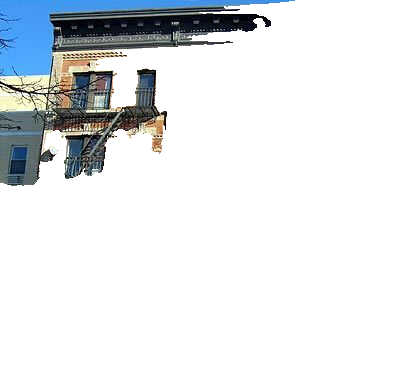
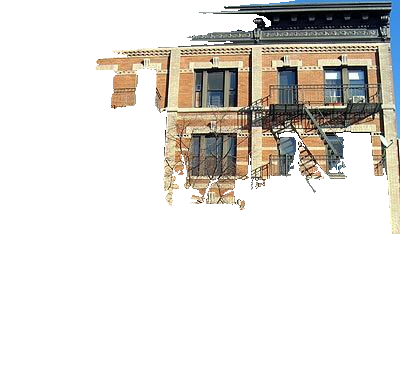
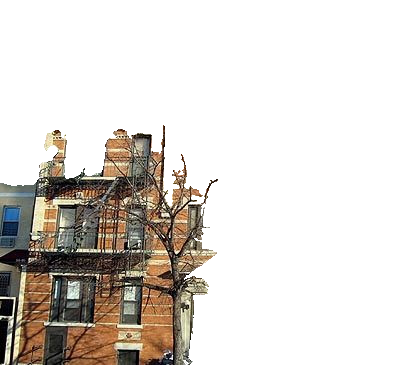
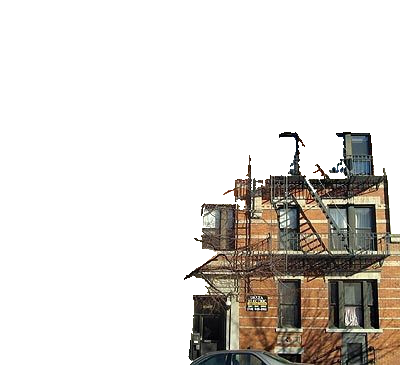


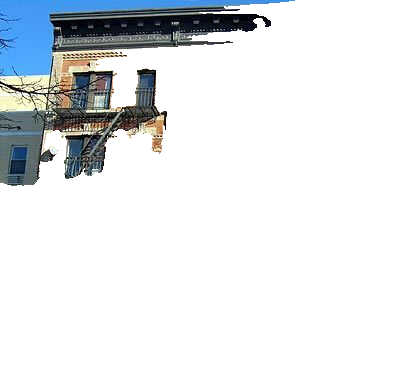
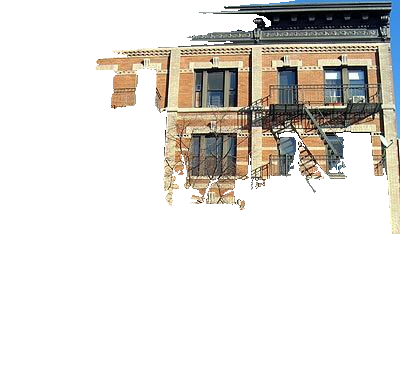
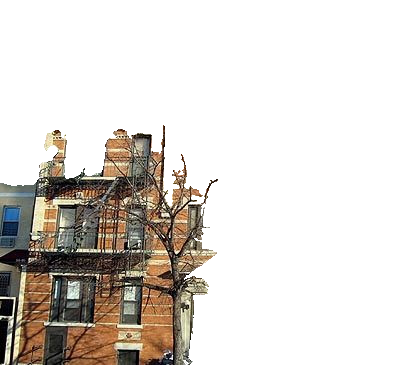
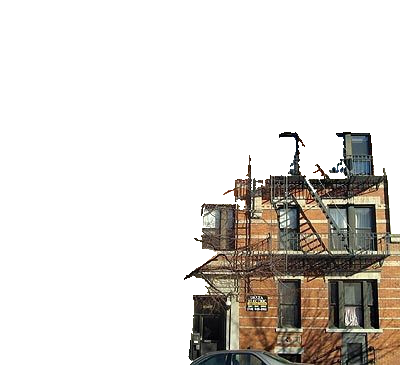

In [128]:
import matplotlib.pyplot as plt
import cv2
import PIL
import ipyplot

from tqdm import tqdm
target_image_id  =15
print("target_image_id::", target_image_id)
image_id = target_image_id

full_masked_image_ls = []

for image_id in tqdm(range(len(raw_img_ls))):
# for image_id in tqdm(range(1)):

    first_mask = masks[image_id]

    # print(len(first_mask))

    first_img = raw_img_ls[image_id]

    first_bbox_ls = bboxes[image_id]

    # print(len(first_bbox_ls))

    masked_image_ls = []

    for idx in range(len(first_bbox_ls)):
        first_bbox = first_bbox_ls[idx]
        masked_image = np.copy(first_img)
        # # print(masked_image.shape)
        masked_image[first_mask != (idx + 1)] = 255 # Set pixels outside the mask to 0
        # curr_patch = PIL.Image.new('RGB', first_img.size)
        # curr_patch.paste(first_img.copy().crop(first_bbox), box=first_bbox)
        # # masked_image = PIL.ImageOps.pad(curr_patch.crop(first_bbox), (224, 224))
        # masked_image = curr_patch.crop(first_bbox)
        masked_image_ls.append(masked_image)

    full_masked_image_ls.append(masked_image_ls)

ipyplot.plot_images(full_masked_image_ls[target_image_id], max_images=len(bboxes[target_image_id]))   

# masked_image = cv2.rectangle(Image.fromarray(masked_image), (first_bbox[0], first_bbox[1]), (first_bbox[2], first_bbox[3]), (255, 0, 0), 2)

# Display the masked part of the image
# plt.imshow(masked_image)
# plt.axis('off')
# plt.show()

# print(np.unique(first_mask))

[1 2 3 4 5 6]


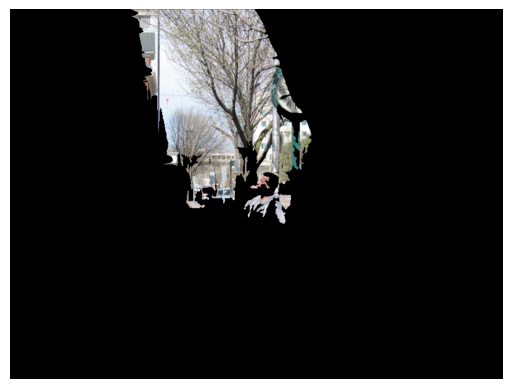

In [114]:
first_mask = masks[0]
first_img = raw_img_ls[0]
first_bbox_ls = bboxes[0]
print(np.unique(first_mask))

first_img_cp = first_img.copy()
first_img_cp_array = np.array(first_img_cp)
first_img_cp_array[first_mask!=2] = 0

plt.imshow(Image.fromarray(first_img_cp_array))

plt.axis('off')
plt.show()

In [66]:
further_masks = get_slic_segments([Image.fromarray(first_img_cp_array)], n_segments=8)

100%|██████████| 1/1 [00:00<00:00,  3.72it/s]


In [67]:
print(np.unique(further_masks))

[1 2 3 4 5 6]


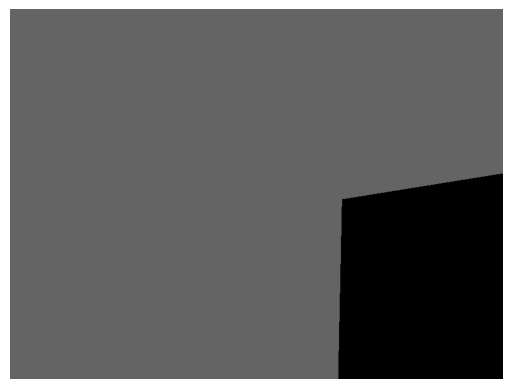

In [68]:
first_img_cp_array_cp1 = np.copy(first_img_cp_array)
first_img_cp_array_cp1[further_masks[0] != 5] = 100
plt.imshow(Image.fromarray(first_img_cp_array_cp1))

plt.axis('off')
plt.show()

In [69]:
sub_idx_ls = np.nonzero(np.array(img_per_patch) == target_image_id)[0].tolist()
first_patch_emb = np.stack([patch_emb[idx] for idx in sub_idx_ls])
print(first_patch_emb.shape)
print(len(bboxes[0]))

(6, 768)
6


In [136]:
# query="the street has a parking meter and a lamp post"
# query="sign on a building with a window and balcony"
# query="sign on a building with a window and balcony"#. 
query="the door has a frame around it, and there is a second window on the building."
inputs = text_processor(query)
inputs = {key: val.to(device) for key, val in inputs.items()}
text_features = model.get_text_features(**inputs)
print(text_features.shape)

torch.Size([1, 768])


# segment images with slic

In [137]:
all_patch_cos_sim_ls = []
all_img_cos_sim_ls = []

for image_id in tqdm(range(len(raw_img_ls))):

    sub_idx_ls = np.nonzero(np.array(img_per_patch) == image_id)[0].tolist()
    first_patch_emb = np.stack([patch_emb[idx] for idx in sub_idx_ls])

    # first_bbox_ls = bboxes[image_id]
    patch_cos_sim_ls = []
    for idx in range(len(first_patch_emb)):
        cosin_sim1 = torch.nn.functional.cosine_similarity(text_features, torch.from_numpy(first_patch_emb[idx]).view(1,-1).to(device), dim=-1)
        patch_cos_sim_ls.append(cosin_sim1)
        # print(idx, cosin_sim1)
    cosin_sim2 = torch.nn.functional.cosine_similarity(text_features, img_emb[image_id].view(1,-1).to(device), dim=-1)
    all_img_cos_sim_ls.append(cosin_sim2)
    all_patch_cos_sim_ls.append(torch.tensor(patch_cos_sim_ls))

# print(cosin_sim1, cosin_sim2)
all_img_cos_sim_tensor = torch.tensor(all_img_cos_sim_ls)
# all_patch_cos_sim_tensor = torch.tensor(all_patch_cos_sim_ls)

100%|██████████| 100/100 [00:00<00:00, 1398.68it/s]


In [138]:
print(all_img_cos_sim_tensor.argmax())
print(all_img_cos_sim_tensor.max())
all_patch_cos_sim_max_scores = torch.tensor([torch.max(all_patch_cos_sim_ls[idx]) for idx in range(len(all_patch_cos_sim_ls))])
print(torch.argmax(all_patch_cos_sim_max_scores))
print(torch.max(all_patch_cos_sim_max_scores))

tensor(98)
tensor(0.1947)
tensor(15)
tensor(0.2119)


In [139]:
full_img_sorted_ids = torch.sort(all_img_cos_sim_tensor, descending=True)[1]
print(torch.nonzero(full_img_sorted_ids == target_image_id))

tensor([[8]])


In [140]:
all_patch_cos_sim_max_scores_full = torch.stack([all_patch_cos_sim_max_scores.view(-1), all_img_cos_sim_tensor.view(-1)], dim=1)
all_patch_cos_sim_max_scores_full_final = torch.max(all_patch_cos_sim_max_scores_full, dim=1)[0]
print(all_patch_cos_sim_max_scores_full_final)
sorted_ids = torch.sort(all_patch_cos_sim_max_scores_full_final, descending=True)[1]

tensor([0.1830, 0.2015, 0.1216, 0.1869, 0.1882, 0.1887, 0.1358, 0.1643, 0.1245,
        0.1692, 0.1827, 0.1722, 0.1253, 0.1594, 0.1970, 0.2119, 0.1746, 0.1995,
        0.1689, 0.1932, 0.1786, 0.1748, 0.1823, 0.1947, 0.1693, 0.1247, 0.1318,
        0.1582, 0.1449, 0.1271, 0.1630, 0.1670, 0.1688, 0.1721, 0.1131, 0.1908,
        0.1769, 0.1636, 0.1738, 0.1763, 0.1051, 0.1150, 0.1284, 0.1592, 0.1396,
        0.1439, 0.1630, 0.0895, 0.1550, 0.1939, 0.1987, 0.1158, 0.1607, 0.1605,
        0.1032, 0.1452, 0.1017, 0.1785, 0.1552, 0.1874, 0.1487, 0.1598, 0.0969,
        0.1475, 0.1697, 0.1613, 0.0904, 0.2000, 0.1817, 0.1650, 0.1831, 0.1935,
        0.1713, 0.1795, 0.1546, 0.1925, 0.1606, 0.1632, 0.1636, 0.2084, 0.1987,
        0.1517, 0.1325, 0.1347, 0.1506, 0.1450, 0.1519, 0.1451, 0.1335, 0.2064,
        0.1198, 0.1704, 0.1643, 0.1096, 0.1554, 0.1813, 0.1849, 0.1888, 0.2032,
        0.1956])


In [141]:
print(sorted_ids)
print(all_patch_cos_sim_max_scores_full_final[target_image_id])
print(torch.nonzero(sorted_ids == target_image_id))

tensor([15, 79, 89, 98,  1, 67, 17, 50, 80, 14, 99, 23, 49, 71, 19, 75, 35, 97,
         5,  4, 59,  3, 96, 70,  0, 10, 22, 68, 95, 73, 20, 57, 36, 39, 21, 16,
        38, 11, 33, 72, 91, 64, 24,  9, 18, 32, 31, 69,  7, 92, 37, 78, 77, 30,
        46, 65, 52, 76, 53, 61, 13, 43, 27, 94, 58, 48, 74, 86, 81, 84, 60, 63,
        55, 87, 85, 28, 45, 44,  6, 83, 88, 82, 26, 42, 29, 12, 25,  8,  2, 90,
        51, 41, 34, 93, 40, 54, 56, 62, 66, 47])
tensor(0.2119)
tensor([[0]])


In [142]:
print(torch.max(all_patch_cos_sim_ls[target_image_id]), torch.argmax(all_patch_cos_sim_ls[target_image_id]))
print(torch.sort(all_patch_cos_sim_ls[target_image_id], descending=True))

tensor(0.2119) tensor(0)
torch.return_types.sort(
values=tensor([0.2119, 0.2105, 0.1829, 0.1816]),
indices=tensor([0, 3, 1, 2]))


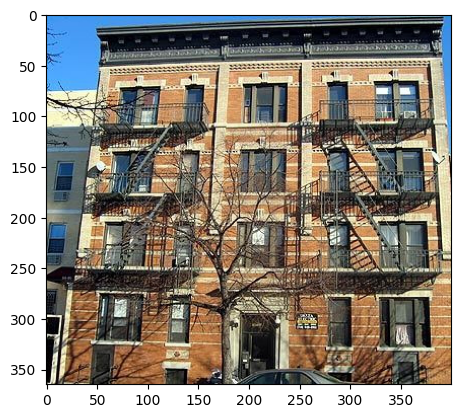

In [135]:
image = raw_img_ls[target_image_id].convert('RGB')

# plt.title("Sheep Image")
# plt.xlabel("X pixel scaling")
# plt.ylabel("Y pixel scaling")
plt.imshow(image)
plt.show()

[1 2 3 4 5 6]
0 81076
81076
[0, 131, 326, 599]


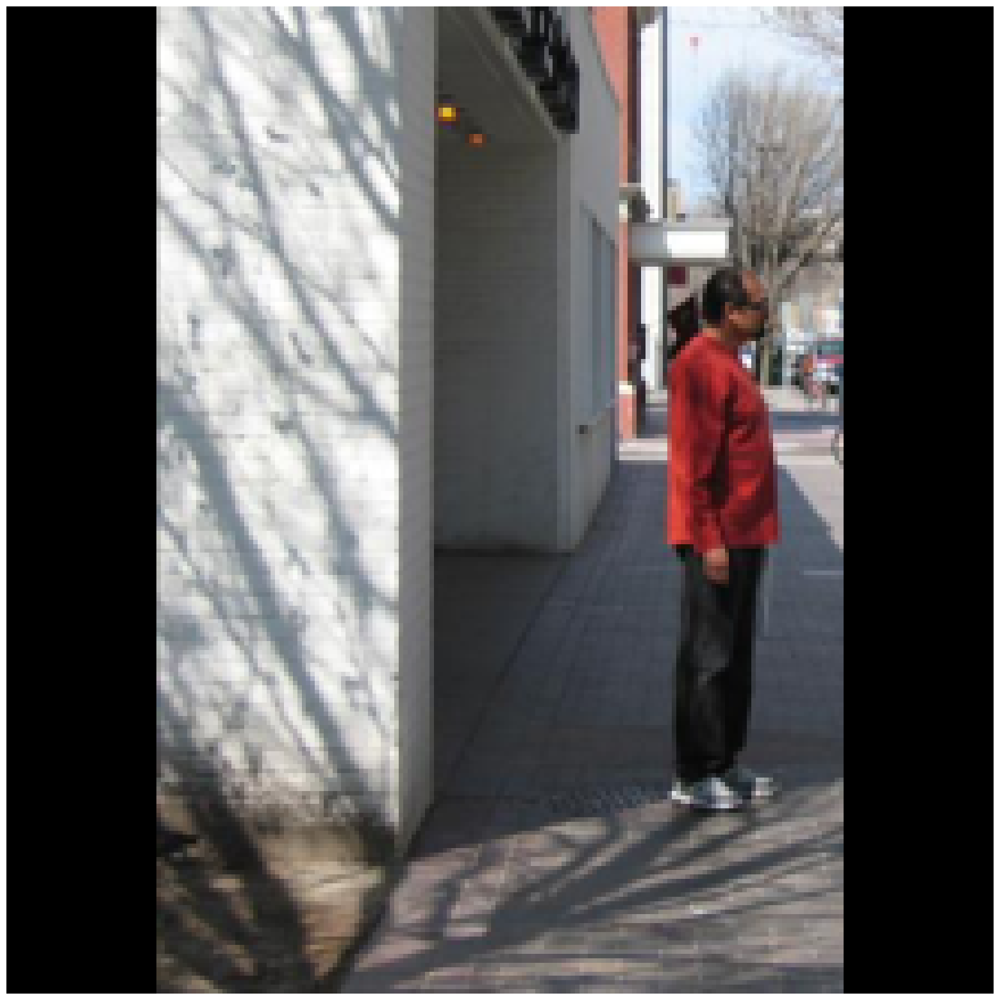

In [78]:
print(np.unique(first_mask))
print(np.sum(first_mask == 15), np.sum(first_mask == 4))
compound_mask = np.logical_or(first_mask == 15, first_mask == 4)

print(np.sum(compound_mask))

y_ls, x_ls = np.nonzero(compound_mask)

x1, y1, x2, y2 = np.min(x_ls), np.min(y_ls), np.max(x_ls), np.max(y_ls)
compound_box = [x1, y1, x2, y2]
print(compound_box)


curr_patch = PIL.Image.new('RGB', first_img.size)
curr_patch.paste(first_img.copy().crop(compound_box), box=compound_box)
masked_image = PIL.ImageOps.pad(curr_patch.crop(compound_box), (224, 224))

plt.figure(figsize=(20,20))

plt.imshow(masked_image)

plt.axis('off')
plt.show()

In [79]:

masked_image_emb, masked_img_for_patch = get_patches_from_bboxes(cl.input_to_latent, cl.model, [first_img], [[compound_box]], cl.input_processor, device=cl.device, resize=cl.image_size)
print(masked_image_emb.shape)

1it [00:00, 19.98it/s]

torch.Size([1, 768])


In [80]:
cosin_sim3 = torch.nn.functional.cosine_similarity(text_features, masked_image_emb.view(1,-1).to(device), dim=-1)
print(cosin_sim3)

tensor([0.1725], device='cuda:0', grad_fn=<SumBackward1>)


# segment images with sam

In [146]:
from segment_anything import SamPredictor, sam_model_registry
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor


def segment_one_image(image):
    checkpoint_path="/data2/wuyinjun/sam/sam_vit_h_4b8939.pth"
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    sam = sam_model_registry["vit_h"](checkpoint=checkpoint_path)
    sam.to(device=device)
    mask_generator = SamAutomaticMaskGenerator(sam
    , points_per_side=16)
    masks = mask_generator.generate(image)

    # print(len(masks))
    return masks


def segment_image_ls(image_ls):
    checkpoint_path="/data2/wuyinjun/sam/sam_vit_h_4b8939.pth"
    device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

    sam = sam_model_registry["vit_h"](checkpoint=checkpoint_path)
    sam.to(device=device)
    mask_generator = SamAutomaticMaskGenerator(sam , points_per_side=16)
    masks_ls = []
    for image in tqdm(image_ls):
        masks = mask_generator.generate(np.array(image))
        masks_ls.append(masks)

    # print(len(masks))
    return masks_ls

# import os
# os.environ["CUDA_VISIBLE_DEVICES"] = "1"
# masks_ls = []
# for idx in tqdm(range(len(raw_img_ls))):
#     masks = segment_one_image(np.array(raw_img_ls[idx]))
#     masks_ls.append(masks)
masks_ls = segment_image_ls(raw_img_ls)
# predictor = SamPredictor(sam)
# predictor.set_image(raw_img_ls[0])
# masks, _, _ = predictor.predict()

100%|██████████| 100/100 [02:36<00:00,  1.57s/it]


In [147]:
utils.save(masks_ls, "output/crepe_masks.pkl")
# utils.dump_pickle("crepe_masks.pkl", masks_ls)

In [82]:
masks_ls = utils.load("output/crepe_masks.pkl")


In [148]:


full_masked_image_emb_ls = []
print("total image count::", len(raw_img_ls))
for idx in range(len(raw_img_ls)):
    print("image idx::", idx)
    masks = masks_ls[idx]
    masked_image_ls = []
    for mask in masks:
        # print(mask.shape)
        # print(np.unique(mask['segmentation']))
        y_ls, x_ls = np.nonzero(mask['segmentation'])
        bbox = [np.min(x_ls), np.min(y_ls), np.max(x_ls), np.max(y_ls)]
        curr_patch = PIL.Image.new('RGB', raw_img_ls[idx].size)
        curr_patch.paste(raw_img_ls[idx].copy().crop(bbox), box=bbox)
        # masked_image0 = curr_patch # PIL.ImageOps.pad(curr_patch.crop(bbox), (224, 224))
        # masked_image = PIL.ImageOps.pad(curr_patch.crop(bbox), curr_patch.size) 
        masked_image = curr_patch.crop(bbox).convert('RGB')
        if masked_image.size[0] > 1 and masked_image.size[1] > 1:
            masked_image_ls.append(masked_image)
        else:
            if masked_image.size[0] == 1:
                masked_image_ls.append(masked_image.resize((2, masked_image.size[1])))
            else:
                masked_image_ls.append(masked_image.resize((masked_image.size[0], 2)))
    
    # print(masked_image_ls[63].size)
    # print(masked_image_ls[62].size)
    masked_image_emb_tensor = get_image_embeddings(masked_image_ls, cl.input_processor, cl.input_to_latent, cl.model, not_normalize=False)
    
    # masked_image_emb_ls.append(masked_image_emb.view(-1))
        
    # masked_image_emb_tensor = torch.stack(masked_image_emb_ls)
    
    full_masked_image_emb_ls.append(masked_image_emb_tensor)
    


total image count:: 100
image idx:: 0


58it [00:02, 28.94it/s]


image idx:: 1


58it [00:01, 31.12it/s]


image idx:: 2


67it [00:02, 31.51it/s]


image idx:: 3


81it [00:02, 31.74it/s]


image idx:: 4


103it [00:03, 31.13it/s]


image idx:: 5


93it [00:02, 32.22it/s]


image idx:: 6


83it [00:02, 31.35it/s]


image idx:: 7


67it [00:02, 27.64it/s]


image idx:: 8


92it [00:03, 29.36it/s]


image idx:: 9


50it [00:01, 29.12it/s]


image idx:: 10


67it [00:02, 28.27it/s]


image idx:: 11


96it [00:03, 29.11it/s]


image idx:: 12


42it [00:01, 29.95it/s]


image idx:: 13


91it [00:03, 28.81it/s]


image idx:: 14


68it [00:02, 29.92it/s]


image idx:: 15


79it [00:02, 29.73it/s]


image idx:: 16


34it [00:01, 30.06it/s]


image idx:: 17


40it [00:01, 30.68it/s]


image idx:: 18


46it [00:01, 30.82it/s]


image idx:: 19


38it [00:01, 30.09it/s]


image idx:: 20


42it [00:01, 31.25it/s]


image idx:: 21


107it [00:03, 31.14it/s]


image idx:: 22


25it [00:00, 26.45it/s]


image idx:: 23


46it [00:01, 26.49it/s]


image idx:: 24


62it [00:02, 30.77it/s]


image idx:: 25


77it [00:02, 30.70it/s]


image idx:: 26


76it [00:02, 28.20it/s]


image idx:: 27


47it [00:01, 28.86it/s]


image idx:: 28


60it [00:02, 26.67it/s]


image idx:: 29


86it [00:03, 26.81it/s]


image idx:: 30


48it [00:01, 26.79it/s]


image idx:: 31


51it [00:01, 27.58it/s]


image idx:: 32


93it [00:03, 29.09it/s]


image idx:: 33


95it [00:03, 28.30it/s]


image idx:: 34


84it [00:03, 27.29it/s]


image idx:: 35


69it [00:02, 27.16it/s]


image idx:: 36


80it [00:03, 25.36it/s]


image idx:: 37


36it [00:01, 26.14it/s]


image idx:: 38


91it [00:03, 27.43it/s]


image idx:: 39


91it [00:03, 26.91it/s]


image idx:: 40


24it [00:00, 27.54it/s]


image idx:: 41


151it [00:05, 27.19it/s]


image idx:: 42


93it [00:03, 26.22it/s]


image idx:: 43


55it [00:02, 23.00it/s]


image idx:: 44


52it [00:02, 24.65it/s]


image idx:: 45


100it [00:03, 25.23it/s]


image idx:: 46


71it [00:02, 25.57it/s]


image idx:: 47


66it [00:02, 26.59it/s]


image idx:: 48


60it [00:02, 25.30it/s]


image idx:: 49


74it [00:03, 24.14it/s]


image idx:: 50


32it [00:01, 24.29it/s]


image idx:: 51


53it [00:01, 26.86it/s]


image idx:: 52


59it [00:02, 23.65it/s]


image idx:: 53


44it [00:01, 24.35it/s]


image idx:: 54


109it [00:04, 26.19it/s]


image idx:: 55


106it [00:04, 25.33it/s]


image idx:: 56


109it [00:04, 24.99it/s]


image idx:: 57


64it [00:02, 22.54it/s]


image idx:: 58


56it [00:02, 25.14it/s]


image idx:: 59


44it [00:01, 25.77it/s]


image idx:: 60


43it [00:01, 24.90it/s]


image idx:: 61


80it [00:03, 25.67it/s]


image idx:: 62


85it [00:03, 25.82it/s]


image idx:: 63


38it [00:01, 25.23it/s]


image idx:: 64


11it [00:00, 26.79it/s]


image idx:: 65


49it [00:02, 23.72it/s]


image idx:: 66


71it [00:02, 25.02it/s]


image idx:: 67


44it [00:01, 26.28it/s]


image idx:: 68


85it [00:03, 24.67it/s]


image idx:: 69


74it [00:02, 25.29it/s]


image idx:: 70


49it [00:01, 26.46it/s]


image idx:: 71


79it [00:02, 26.45it/s]


image idx:: 72


66it [00:02, 25.95it/s]


image idx:: 73


73it [00:02, 25.76it/s]


image idx:: 74


66it [00:02, 26.24it/s]


image idx:: 75


104it [00:04, 25.43it/s]


image idx:: 76


93it [00:03, 25.93it/s]


image idx:: 77


61it [00:02, 25.59it/s]


image idx:: 78


69it [00:02, 24.79it/s]


image idx:: 79


88it [00:03, 25.46it/s]


image idx:: 80


56it [00:02, 26.53it/s]


image idx:: 81


74it [00:02, 25.81it/s]


image idx:: 82


40it [00:01, 24.71it/s]


image idx:: 83


73it [00:02, 26.65it/s]


image idx:: 84


75it [00:02, 26.77it/s]


image idx:: 85


78it [00:02, 26.21it/s]


image idx:: 86


86it [00:03, 26.59it/s]


image idx:: 87


59it [00:02, 27.09it/s]


image idx:: 88


63it [00:02, 25.73it/s]


image idx:: 89


67it [00:02, 26.79it/s]


image idx:: 90


47it [00:01, 27.15it/s]


image idx:: 91


40it [00:01, 25.93it/s]


image idx:: 92


36it [00:01, 26.12it/s]


image idx:: 93


104it [00:03, 26.43it/s]


image idx:: 94


74it [00:02, 26.08it/s]


image idx:: 95


57it [00:02, 25.50it/s]


image idx:: 96


90it [00:03, 26.07it/s]


image idx:: 97


56it [00:02, 25.28it/s]


image idx:: 98


37it [00:01, 25.30it/s]


image idx:: 99


53it [00:02, 25.89it/s]


In [ ]:
utils.save(full_masked_image_emb_ls, "output/crepe_masked_image_emb_ls.pkl")

In [84]:
full_masked_image_emb_ls = utils.load("output/crepe_masked_image_emb_ls.pkl")

In [85]:
all_patch_cos_sim_ls2 = []
# all_img_cos_sim_ls = []

for image_id in tqdm(range(len(raw_img_ls))):

    sub_idx_ls = np.nonzero(np.array(img_per_patch) == image_id)[0].tolist()
    # first_patch_emb = np.stack([patch_emb[idx] for idx in sub_idx_ls])
    masked_image_emb_ls = full_masked_image_emb_ls[image_id]

    # first_bbox_ls = bboxes[image_id]
    patch_cos_sim_ls = []
    for idx in range(len(masked_image_emb_ls)):
        cosin_sim1 = torch.nn.functional.cosine_similarity(text_features, masked_image_emb_ls[idx].view(1,-1).to(device), dim=-1)
        patch_cos_sim_ls.append(cosin_sim1)
        # print(idx, cosin_sim1)
    # cosin_sim2 = torch.nn.functional.cosine_similarity(text_features, img_emb[image_id].view(1,-1).to(device), dim=-1)
    # all_img_cos_sim_ls.append(cosin_sim2)
    all_patch_cos_sim_ls2.append(torch.tensor(patch_cos_sim_ls))

# print(cosin_sim1, cosin_sim2)
# all_img_cos_sim_tensor = torch.tensor(all_img_cos_sim_ls)

 14%|█▍        | 14/100 [00:00<00:01, 65.15it/s]

100%|██████████| 100/100 [00:01<00:00, 72.25it/s]


In [86]:
all_patch_cos_sim_max_scores2 = torch.tensor([torch.max(all_patch_cos_sim_ls2[idx]) for idx in range(len(all_patch_cos_sim_ls2))])
print(all_patch_cos_sim_max_scores2[15])
print(torch.argmax(all_patch_cos_sim_max_scores2))
print(torch.max(all_patch_cos_sim_max_scores2))

full_img_sorted_ids = torch.sort(all_patch_cos_sim_max_scores2, descending=True)[1]
print(torch.nonzero(full_img_sorted_ids == 0))

tensor(0.2150)
tensor(7)
tensor(0.2504)
tensor([[50]])


In [87]:
all_img_sorted_ids = torch.sort(all_img_cos_sim_tensor, descending=True)[1]
print(torch.nonzero(all_img_sorted_ids == 0))
print(all_img_cos_sim_tensor[0])

tensor([[69]])
tensor(0.1257)


In [88]:
print(torch.max(all_patch_cos_sim_ls2[0]), torch.argmax(all_patch_cos_sim_ls2[0]))
print(torch.sort(all_patch_cos_sim_ls2[0], descending=True))

tensor(0.2217) tensor(71)
torch.return_types.sort(
values=tensor([0.2217, 0.2159, 0.2131, 0.2125, 0.2056, 0.2009, 0.2008, 0.2006, 0.1980,
        0.1961, 0.1954, 0.1950, 0.1930, 0.1925, 0.1915, 0.1910, 0.1910, 0.1905,
        0.1889, 0.1884, 0.1873, 0.1872, 0.1858, 0.1843, 0.1835, 0.1834, 0.1832,
        0.1827, 0.1826, 0.1812, 0.1811, 0.1798, 0.1796, 0.1796, 0.1786, 0.1783,
        0.1782, 0.1779, 0.1777, 0.1775, 0.1759, 0.1753, 0.1751, 0.1740, 0.1739,
        0.1735, 0.1724, 0.1719, 0.1715, 0.1708, 0.1704, 0.1704, 0.1699, 0.1698,
        0.1692, 0.1690, 0.1689, 0.1687, 0.1672, 0.1668, 0.1664, 0.1661, 0.1656,
        0.1651, 0.1647, 0.1638, 0.1634, 0.1634, 0.1633, 0.1630, 0.1626, 0.1625,
        0.1624, 0.1622, 0.1604, 0.1596, 0.1595, 0.1594, 0.1593, 0.1581, 0.1580,
        0.1573, 0.1573, 0.1572, 0.1571, 0.1555, 0.1550, 0.1531, 0.1520, 0.1519,
        0.1512, 0.1501, 0.1501, 0.1498, 0.1494, 0.1490, 0.1488, 0.1480, 0.1476,
        0.1475, 0.1472, 0.1471, 0.1413, 0.1390, 0.1390, 0.1363

In [89]:
print(list(masks[0].keys()))
print(np.sum(masks[0]['segmentation']), masks[0]["area"])

['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box']
55897 55897


In [90]:
import cv2
def generate_dialated_mask(mask, dilation_size=5):
    kernel = np.ones((dilation_size, dilation_size), np.uint8)

    binary_image = np.array(mask).astype(np.uint8)

    # Perform dilation
    dilated_image = cv2.dilate(binary_image, kernel, iterations=1)
    # from skimage.morphology import disk, dilation
    # selem = disk(dilation_size)
    # return dilation(mask, selem)
    return dilated_image


def generate_dialated_mask_ls(segmentations, dilation_size=10):
    return [generate_dialated_mask(segment['segmentation'], dilation_size) for segment in segmentations]


dilated_masks = generate_dialated_mask_ls(masks)

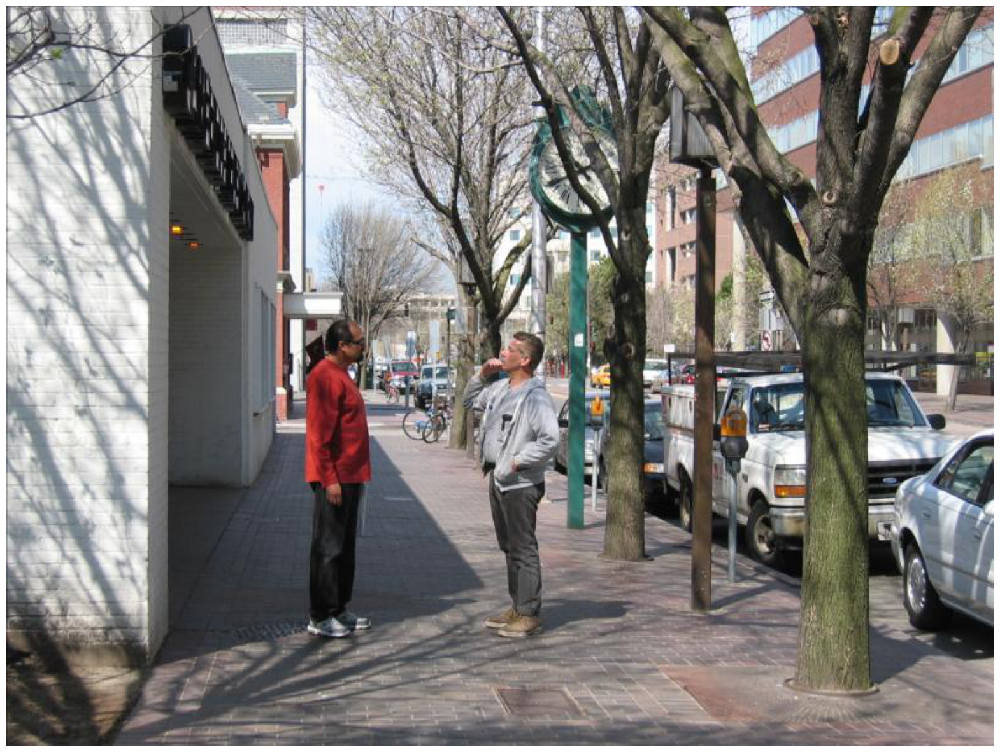

In [91]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)
    
import cv2
image = np.array(raw_img_ls[0])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


plt.figure(figsize=(20,20))
masked_image = np.copy(raw_img_ls[0])
# masked_image[np.logical_and(~masks[2]['segmentation'], ~masks[1]['segmentation'])] = 255
# masked_image[~masks[4]['segmentation']] = 255
plt.imshow(masked_image)
# show_anns(masks)
plt.axis('off')
plt.show()

In [92]:
import cv2
def are_segments_neighbors(seg1_mask, seg2_mask):
    """Check if two image segments are neighbors using connected component labeling."""
    # Find contours for the segments
    # seg1_mask = Image.fromarray(seg1_mask)
    # seg2_mask = Image.fromarray(seg2_mask)
    
    contours1, _ = cv2.findContours(seg1_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours2, _ = cv2.findContours(seg2_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Check if any contour from one segment intersects with any contour from the other segment
    for contour1 in contours1:
        for contour2 in contours2:
            intersection = cv2.pointPolygonTest(contour2, tuple(contour1[0][0]), measureDist=False)
            if intersection == 0 or intersection == 1:
                return True  # Contours intersect, segments are neighbors
    return False

def are_segments_neighbors0(seg1_mask, seg2_mask):
    intersection = np.logical_and(seg1_mask, seg2_mask)
    return np.any(intersection)


# is_neighbor = are_segments_neighbors(masks[1]['segmentation'].astype(np.uint8), masks[2]['segmentation'].astype(np.uint8))
is_neighbor = are_segments_neighbors0(dilated_masks[1], dilated_masks[2])
print(is_neighbor)

False


In [93]:
gray = cv2.cvtColor(np.array(raw_img_ls[0]),cv2.COLOR_BGR2GRAY)
_,binary = cv2.threshold(gray,100,255,cv2.THRESH_BINARY)

image,contours = cv2.findContours(binary,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)

In [94]:
print(binary.dtype)
print(masks[1]['segmentation'])

uint8
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


In [95]:
def derive_all_neighbors(mask_ls):

    neighbor_mapping_ls = []
    for i in range(len(mask_ls)):
        curr_neighbors = []
        for j in range(len(mask_ls)):
            if j != i:
                # is_neighbor = are_segments_neighbors(masks[i]['segmentation'], masks[j]['segmentation'])
                is_neighbor = are_segments_neighbors0(mask_ls[i], mask_ls[j])
                if is_neighbor:
                    curr_neighbors.append(j)
        neighbor_mapping_ls.append(curr_neighbors)
    return neighbor_mapping_ls

neighbor_mapping_ls = derive_all_neighbors(dilated_masks)
print(neighbor_mapping_ls[4])

[0, 59, 109, 167]


In [96]:
all_mask = np.zeros(masks[0]['segmentation'].shape).astype(bool)
for idx in neighbor_mapping_ls[4]:
    print(idx)
    all_mask = np.logical_or(all_mask, masks[idx]['segmentation'])

all_mask = np.logical_or(all_mask, masks[4]['segmentation'])

0
59
109
167


In [97]:
print(masks[4])

{'segmentation': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), 'area': 5529, 'bbox': [705, 137, 94, 60], 'predicted_iou': 1.0090210437774658, 'point_coords': [[712.5, 178.125]], 'stability_score': 0.99028080701828, 'crop_box': [0, 0, 800, 600]}


In [98]:
kernel = np.ones((3, 3), np.uint8)

binary_image = np.array(masks[1]['segmentation']).astype(np.uint8)

# Perform dilation
dilated_image = cv2.dilate(binary_image, kernel, iterations=1)

In [99]:
print(np.sum(binary_image))
print(np.unique(dilated_image))

104326
[0 1]


In [100]:
raw_img_ls[0].size

(800, 600)


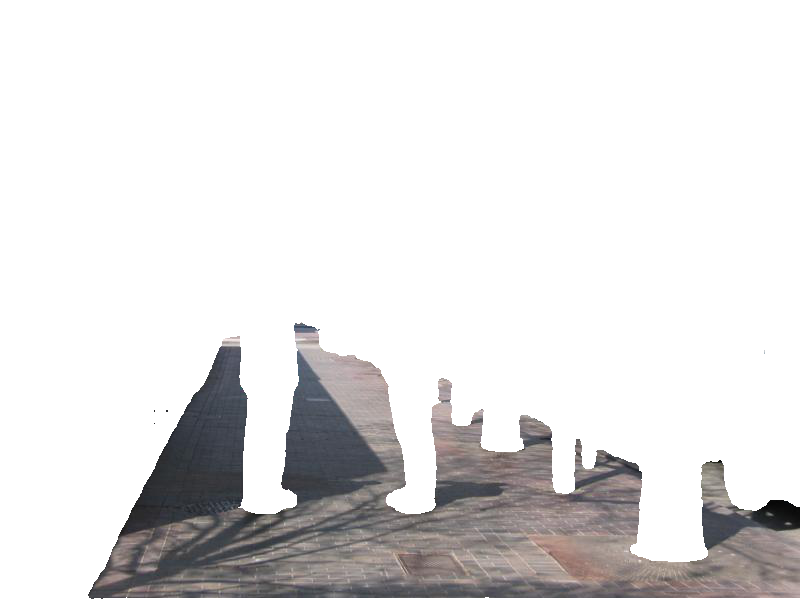
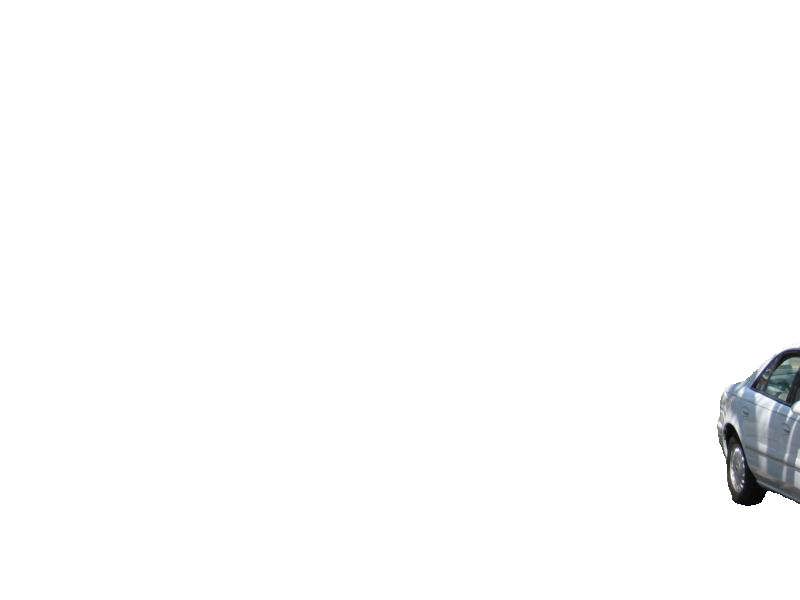
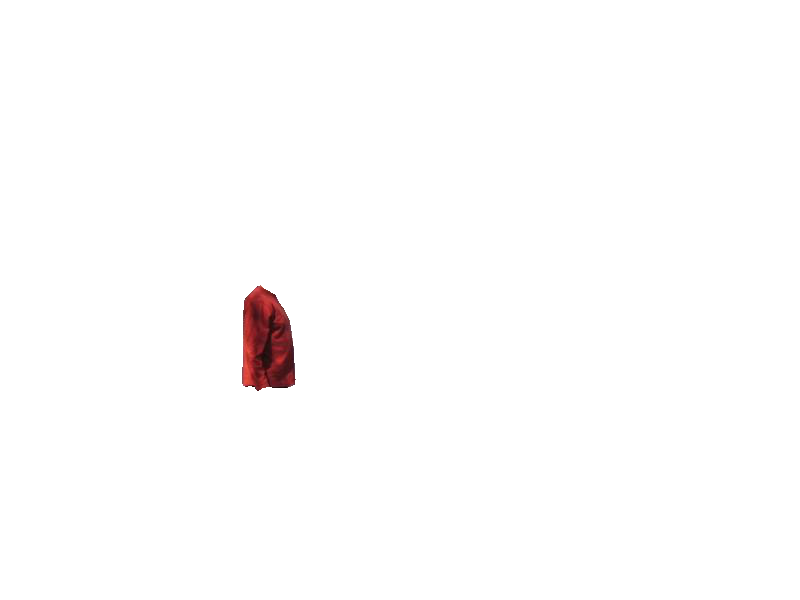
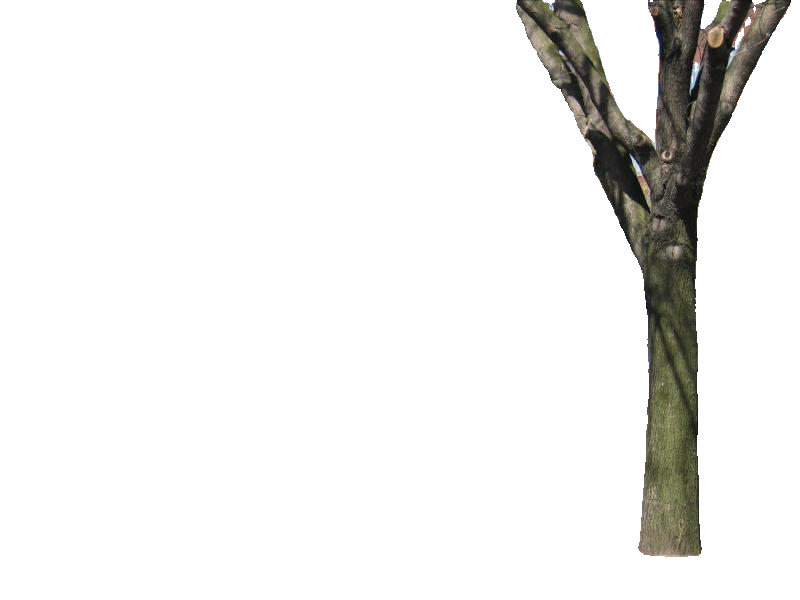
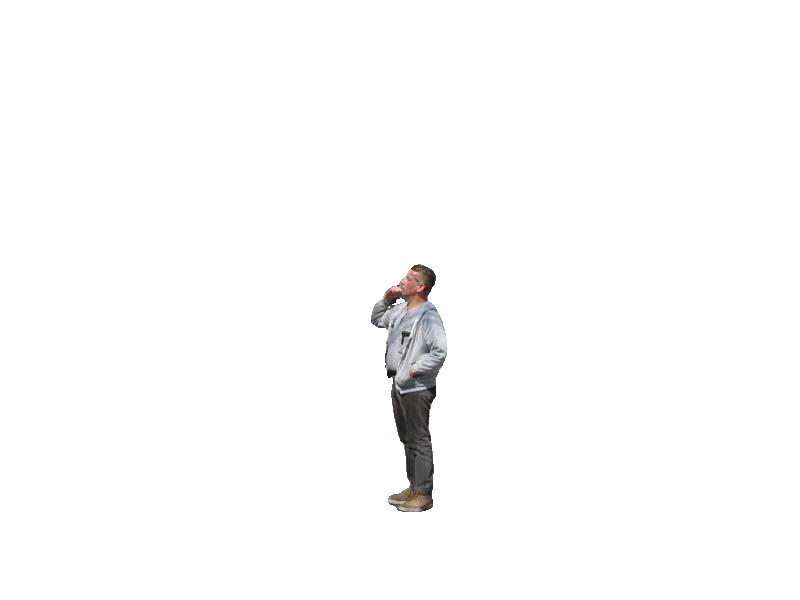
...
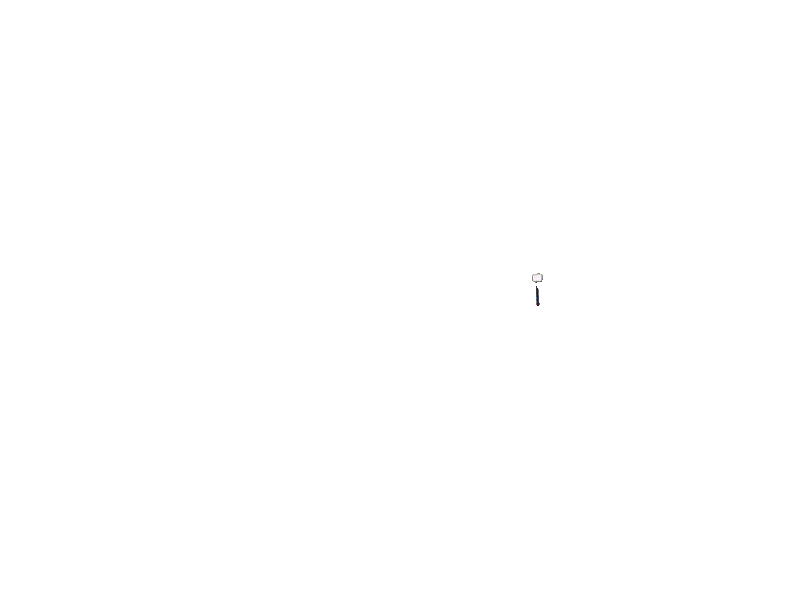
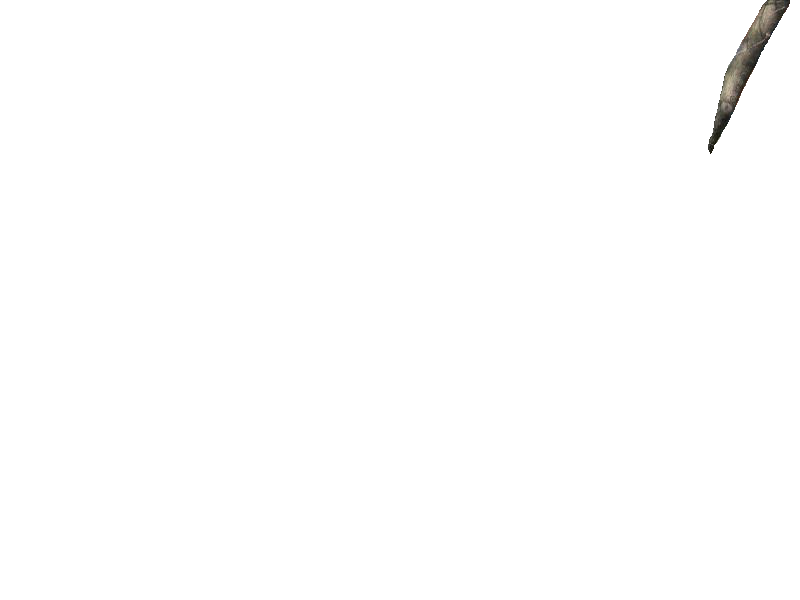
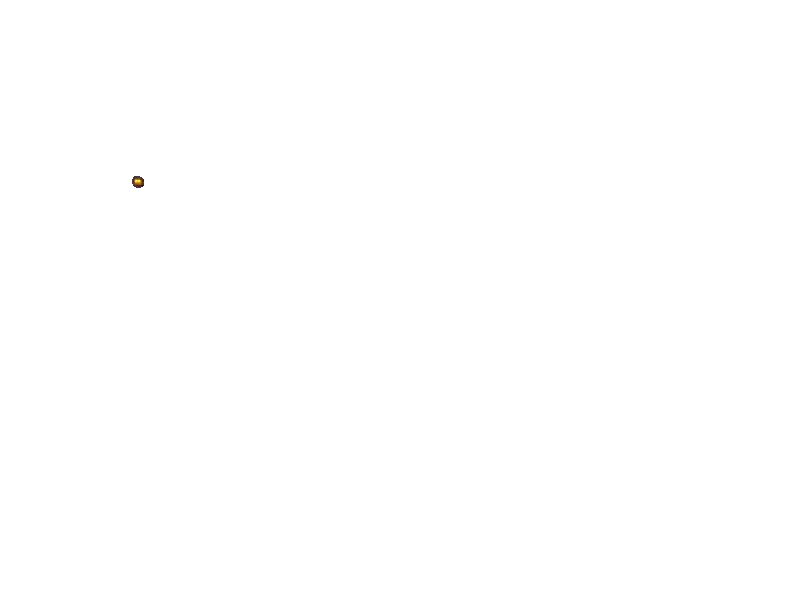
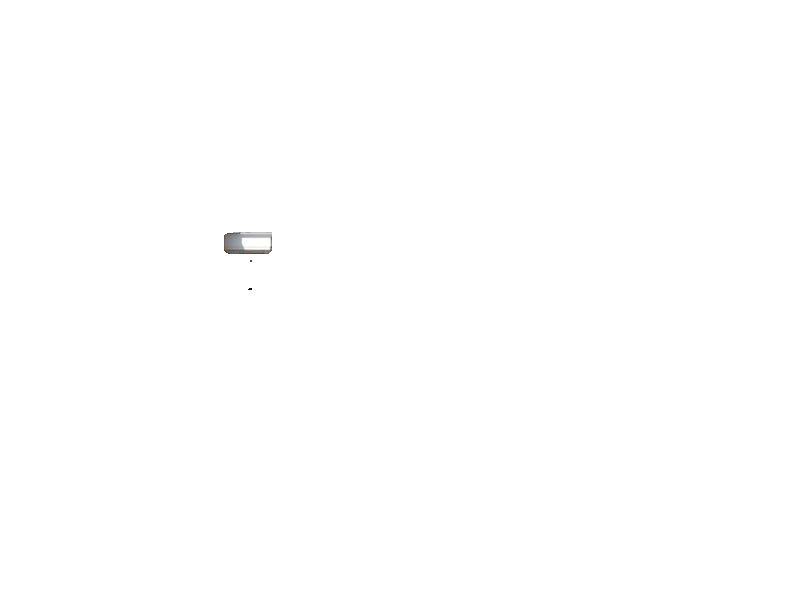
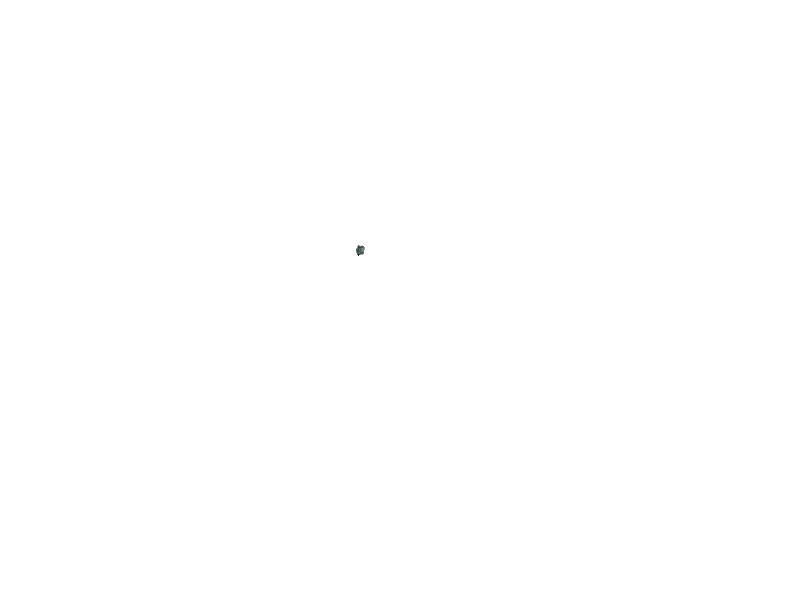

In [101]:
# tree:0, 10
# car:13
import ipyplot
img_id=0
# fig, axes = plt.subplots(10, 1, figsize=(12, 8))

def show_all_masked_image_ls(raw_img, masks):

        masked_image_ls = []

        # for i, ax in enumerate(axes.flat):
        for i in range(len(masks)):
                # if i < 10:
                masked_image = np.copy(raw_img)
                masked_image[~masks[i]['segmentation']] = 255
                masked_image_ls.append(masked_image)
                # masked_image = Image.fromarray(masked_image)
                # ax.imshow(masked_image.resize(12, 8))
                # ax.axis("off")

        ipyplot.plot_images(masked_image_ls, max_images=len(masks))   

show_all_masked_image_ls(raw_img_ls[img_id], masks_ls[img_id])
        # ax.set_title(f"Segment {i}")
# plt.show()
        # else:
        #     ax.axis("off")


# plt.figure(figsize=(20,20))
# for idx in range(len(masks)):
#     masked_image = np.copy(raw_img_ls[0])
#     masked_image[~masks[idx]['segmentation']] = 255
# # masked_image[~all_mask.astype(bool)] = 255
#     plt.imshow(masked_image)
#     plt.title(f"Segment {idx}")
# # show_anns(masks)
#     plt.axis('off')
# plt.show()

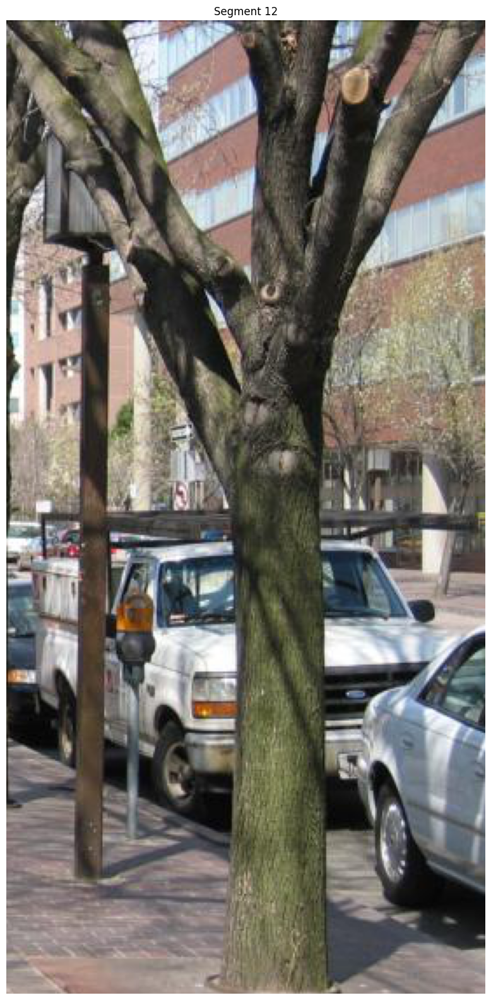

In [102]:
masks = masks_ls[img_id]
all_mask = np.zeros(masks[0]['segmentation'].shape).astype(bool)
# mask_id_ls = [2,29,130]
# mask_id_ls = range(8,9)
# mask_id_ls=[8, 12, 20, 170]#, 173, 149, 134, 2, 3, 44, 5, 6, 9, 8, 15] + list(range(1,100))
# mask_id_ls=[20, 12]
# mask_id_ls = [3,  12,   0,   6]
mask_id_ls = [3,   12]
# mask_id_ls=[65,  17,  37, 112]
# mask_id_ls=[65]
# mask_id_ls=[1]

# mask_id_ls = [0,8]
# for idx in range(len(masks)):
for idx in mask_id_ls:
    # print(idx)
    all_mask = np.logical_or(all_mask, masks[idx]['segmentation'])

plt.figure(figsize=(20,20))
# # for idx in range(len(masks)):


# masked_image = np.copy(raw_img_ls[img_id])
# masked_image[~all_mask] = 255
# masked_image = Image.fromarray(masked_image)

# y_ls, x_ls = np.nonzero(all_mask)
# bbox = [np.min(x_ls), np.min(y_ls), np.max(x_ls), np.max(y_ls)]

# curr_patch = PIL.Image.new('RGB', raw_img_ls[img_id].size)
# curr_patch.paste(masked_image.copy().crop(bbox), box=bbox)
# masked_image0 = curr_patch # PIL.ImageOps.pad(curr_patch.crop(bbox), (224, 224))
# masked_image = PIL.ImageOps.pad(curr_patch.crop(bbox), curr_patch.size)



y_ls, x_ls = np.nonzero(all_mask)
bbox = [np.min(x_ls), np.min(y_ls), np.max(x_ls), np.max(y_ls)]
curr_patch = PIL.Image.new('RGB', raw_img_ls[img_id].size)
curr_patch.paste(raw_img_ls[img_id].copy().crop(bbox), box=bbox)
masked_image0 = curr_patch # PIL.ImageOps.pad(curr_patch.crop(bbox), (224, 224))
# masked_image = PIL.ImageOps.pad(curr_patch.crop(bbox), curr_patch.size)
masked_image = curr_patch.crop(bbox)#.resize((224, 224))
# masked_image[~all_mask.astype(bool)] = 255
plt.imshow(masked_image)
plt.title(f"Segment {idx}")
# show_anns(masks)
plt.axis('off')
plt.show()

In [103]:
masked_image_emb = get_image_embeddings([masked_image], cl.input_processor, cl.input_to_latent, cl.model, not_normalize=False)

1it [00:00, 21.97it/s]


In [104]:
cosin_sim4 = torch.nn.functional.cosine_similarity(text_features, masked_image_emb.view(1,-1).to(device), dim=-1)
print(cosin_sim4)

tensor([0.1390], device='cuda:0', grad_fn=<SumBackward1>)


In [105]:
cosin_sim4 = torch.nn.functional.cosine_similarity(text_features, img_emb[15].view(1,-1).to(device), dim=-1)
print(cosin_sim4)

tensor([0.1417], device='cuda:0', grad_fn=<SumBackward1>)
